In [52]:
import os
import pickle
import matplotlib.pyplot as plt
import numpy as np

from skimage.util import invert
from skimage.filters import threshold_otsu
from skimage import io, color, morphology, segmentation

In [53]:
from skimage import data
from skimage.exposure import histogram
from skimage.feature import canny
from scipy import ndimage as ndi

In [54]:
def grey_image_transform(image):
    return color.rgb2gray(image)

def binarize_image(image):
    thresh = threshold_otsu(image)
    image = image > thresh
    return image

def get_image_masks(image, luminosity):
    lum = color.rgb2gray(image)
    lum = binarize_image(lum)
    mask = lum
    mask1 = invert(lum)
    mask1 = morphology.remove_small_objects(mask1 < luminosity)
    mask1 = morphology.remove_small_holes(mask1,10)
    mask = morphology.opening(mask, morphology.disk(3))
    mask = invert(mask)
    mask = mask&mask1
#     mask = invert(mask)
    mask = binarize_image(mask)
    return mask


def plot_images(image, chull):
    fig, axes = plt.subplots(1, 2, figsize=(8, 4))
    ax = axes.ravel()

    ax[0].set_title('Original picture')
    ax[0].imshow(image, cmap=plt.cm.gray)
    ax[0].set_axis_off()

    ax[1].set_title('Transformed picture')
    ax[1].imshow(chull, cmap=plt.cm.gray)
    ax[1].set_axis_off()

    plt.tight_layout()
    plt.show()  

In [55]:
input_dir = './../../../temp_data/images/'
output_dir = './../../../temp_data/results/img_processing/'

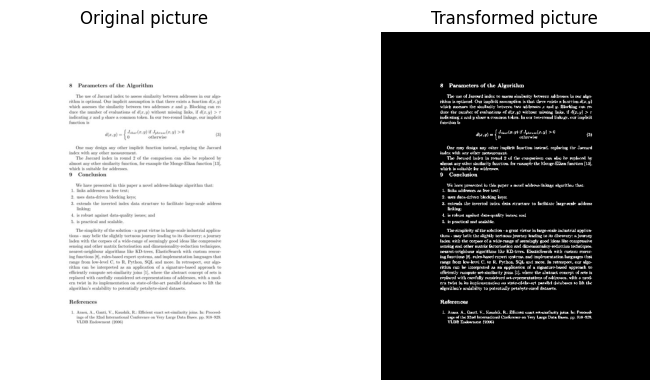

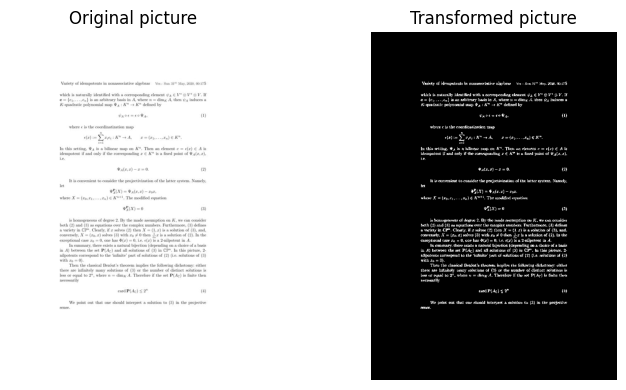

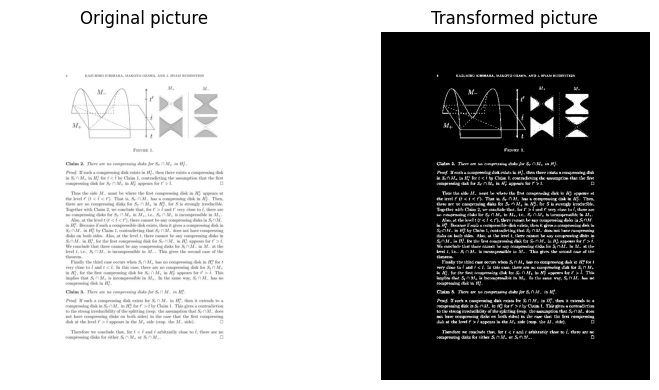

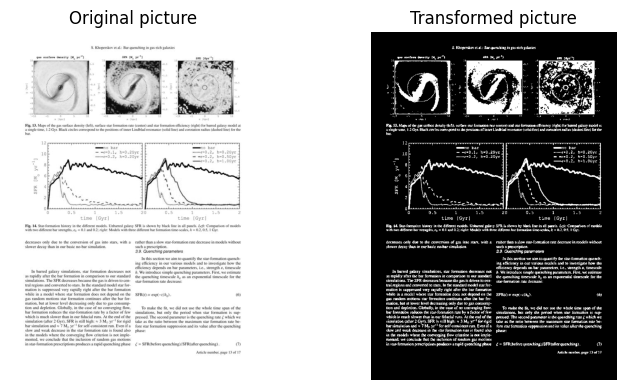

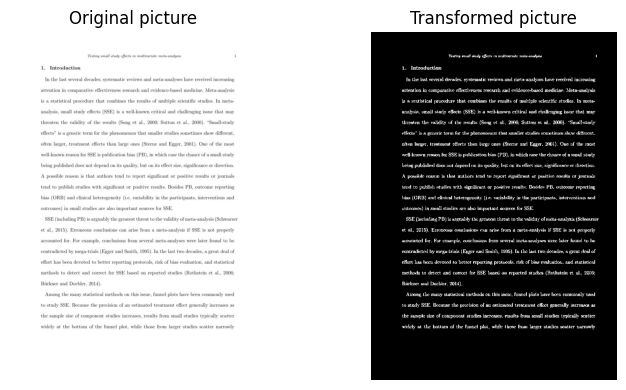

...

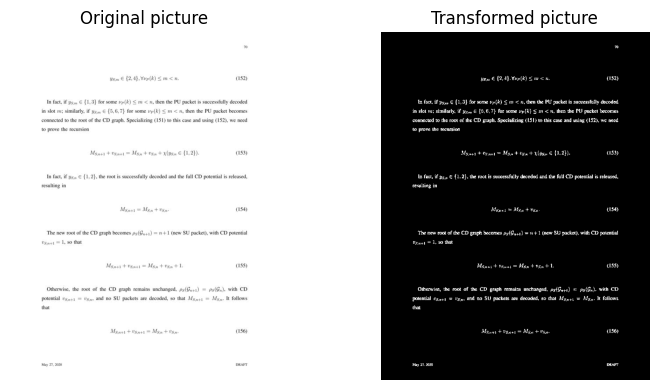

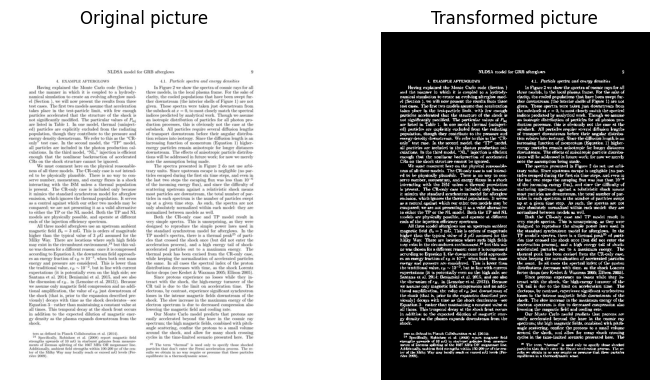

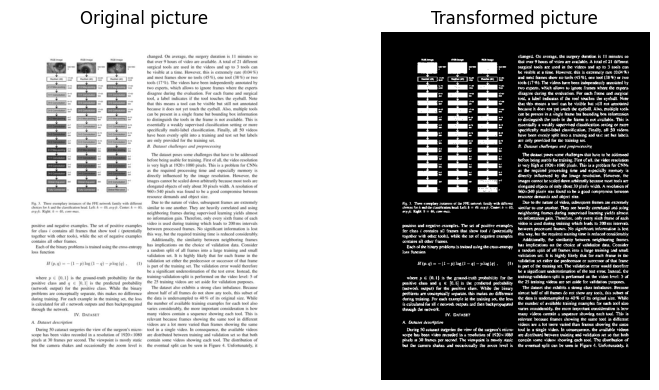

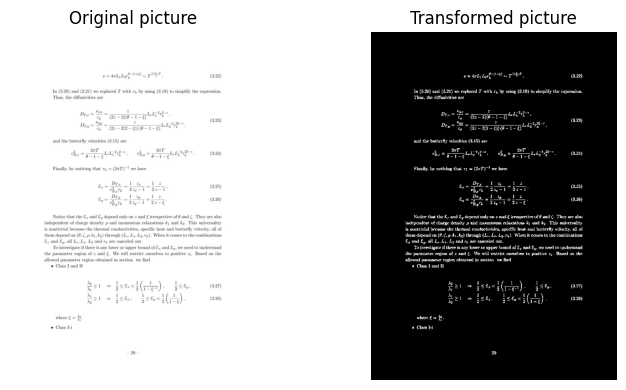

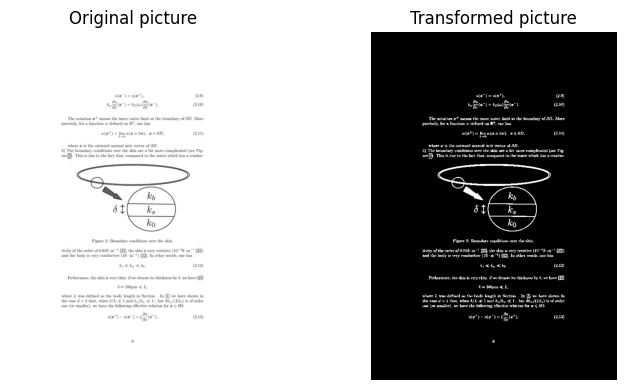

In [56]:
dir_list = os.listdir(input_dir)
results = {}
# count = 0

for image in dir_list:
    coins = io.imread(input_dir + image)
    coins = color.rgb2gray(coins)
    elevation_map = sobel(coins)
    markers = np.zeros_like(coins)
    markers[coins < 0.8] = 1
    markers[coins > 0.8] = 2

    segmentation = watershed(elevation_map, markers)
    segmentation = binarize_image(segmentation)
    segmentation = invert(segmentation)
    plot_images(coins, segmentation)

In [37]:
coins = io.imread('./../../../temp_data/images/10.tar_1701.04170.gz_TPNL_afterglow_evo_8_pro.jpg')
coins = color.rgb2gray(coins)

In [50]:
from skimage.filters import sobel
from skimage.segmentation import watershed


In [51]:
segmentation

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])